Package install and import

In [10]:
!pip install statsmodels
!pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 40.8 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.9/233.9 kB 7.0 MB/s eta 0:00:00


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import pearsonr
from statsmodels.formula.api import ols
from sklearn.model_selection import train_test_split
import os
import pickle
import openpyxl


Loading the dataset

In [7]:
# Đọc file data.pkl
df = pd.read_pickle('data/clean/data.pkl')
df.head()

,Tên hãng xe,Tên dòng xe,Năm sản xuất,Giá,Tỉnh,Tình trạng,Số Km đã đi,Xuất xứ,Kiểu dáng,Hộp số,Màu ngoại thất,Màu nội thất,Số chỗ ngồi,Số cửa,Dẫn động,Loại động cơ,Dung tích
0,Nissan,Navara VL 2.5 AT 4WD,2017.0,485000000.0,Hà Nội,Xe đã dùng,60000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Xanh,Ghi,5.0,4.0,4WD - Dẫn động 4 bánh,Dầu,2.5
1,Nissan,Navara EL Premium R,2018.0,464000000.0,TP HCM,Xe đã dùng,130000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Xanh,Đen,5.0,4.0,RFD - Dẫn động cầu sau,Dầu,2.5
2,Nissan,Sunny Q Series XT Premium,2018.0,350000000.0,Hà Nội,Xe đã dùng,21099.0,Lắp ráp trong nước,Sedan,Số tự động,Xám,Kem,5.0,4.0,FWD - Dẫn động cầu trước,Xăng,1.5
3,Nissan,Navara VL 2.5 AT 4WD,2015.0,415000000.0,Hà Nội,Xe đã dùng,180000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Cam,Kem,5.0,4.0,4WD - Dẫn động 4 bánh,Dầu,2.5
4,Nissan,Almera VL 1.0 CVT Cao cấp,2022.0,510000000.0,TP HCM,Xe đã dùng,26000.0,Nhập khẩu,Sedan,Số tự động,Đỏ,Đen,5.0,4.0,FWD - Dẫn động cầu trước,Xăng,1.0


# Preparation and cleaning

In [13]:
# Mô tả các cột
df.describe()

,URL,Tình trạng chung,Tên xe,Giá,Tỉnh,Mã xe,Năm sản xuất,Tình trạng,Số Km đã đi,Xuất xứ,Kiểu dáng,Hộp số,Động cơ,Màu ngoại thất,Màu nội thất,Số chỗ ngồi,Số cửa,Dẫn động,Mô tả
count,30881,30881,30881,30881,30881,30881,30881,30881,24600,30881,30881,30881,30881,30881,30881,30881,30881,30881,30881
unique,30514,2,4743,2194,63,30514,36,2,1780,2,10,2,89,18,18,21,7,5,28182
top,https://bonbanh.com/xe-toyota-fortuner-2.7v-4x...,Xe cũ,Toyota Land Cruiser 3.5 V6 - 2024,495000000,Hà Nội,5480920,2024,Xe đã dùng,0 Km,Lắp ráp trong nước,SUV,Số tự động,Xăng 2.0 L,Trắng,Đen,5 chỗ,5 cửa,FWD - Dẫn động cầu trước,CHỈ CÒN 3 NGÀY CUỐI NHẬN CHÍNH SÁCH ĐẶC QUYỀN\...
freq,2,24600,144,192,16834,2,4603,24600,3864,17464,12041,26521,7413,10518,13781,20823,18314,16488,54


## Clean

In [14]:
# Thông tin của dataframe
df.info()

# Xóa các hàng trùng lặp
df = df.drop_duplicates()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30881 entries, 0 to 30880
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   URL               30881 non-null  object
 1   Tình trạng chung  30881 non-null  object
 2   Tên xe            30881 non-null  object
 3   Giá               30881 non-null  object
 4   Tỉnh              30881 non-null  object
 5   Mã xe             30881 non-null  object
 6   Năm sản xuất      30881 non-null  object
 7   Tình trạng        30881 non-null  object
 8   Số Km đã đi       24600 non-null  object
 9   Xuất xứ           30881 non-null  object
 10  Kiểu dáng         30881 non-null  object
 11  Hộp số            30881 non-null  object
 12  Động cơ           30881 non-null  object
 13  Màu ngoại thất    30881 non-null  object
 14  Màu nội thất      30881 non-null  object
 15  Số chỗ ngồi       30881 non-null  object
 16  Số cửa            30881 non-null  object
 17  Dẫn động    

In [15]:
# Các giá trị của mỗi cột
df.nunique()

URL                 30514
Tình trạng chung        2
Tên xe               4743
Giá                  2194
Tỉnh                   63
Mã xe               30514
Năm sản xuất           36
Tình trạng              2
Số Km đã đi          1780
Xuất xứ                 2
Kiểu dáng              10
Hộp số                  2
Động cơ                89
Màu ngoại thất         18
Màu nội thất           18
Số chỗ ngồi            21
Số cửa                  7
Dẫn động                5
Mô tả               28182
dtype: int64

In [16]:
# Các giá trị còn thiếu
df.isnull().sum()

URL                    0
Tình trạng chung       0
Tên xe                 0
Giá                    0
Tỉnh                   0
Mã xe                  0
Năm sản xuất           0
Tình trạng             0
Số Km đã đi         6204
Xuất xứ                0
Kiểu dáng              0
Hộp số                 0
Động cơ                0
Màu ngoại thất         0
Màu nội thất           0
Số chỗ ngồi            0
Số cửa                 0
Dẫn động               0
Mô tả                  0
dtype: int64

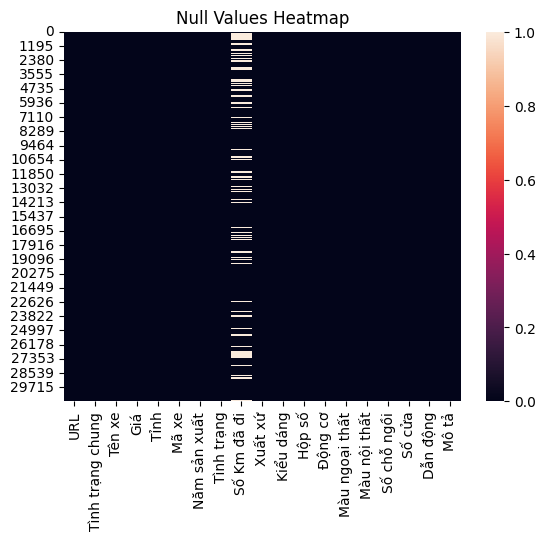

In [17]:
sns.heatmap(df.isnull(), cbar=True)
plt.title('Null Values Heatmap')
plt.show()

In [18]:
# Loại bỏ phần ' km' và chuyển đổi kiểu dữ liệu của cột 'Số Km đã đi'
df['Số Km đã đi'] = df['Số Km đã đi'].str.replace(' Km', '').str.replace(',', '').astype(float)

In [19]:
# Gán giá trị 0 cho cột 'Số Km đã đi' nếu cột 'Tình trạng' là 'Xe mới'
df.loc[df['Tình trạng'] == 'Xe mới', 'Số Km đã đi'] = 0


In [20]:
df.isnull().sum()

URL                 0
Tình trạng chung    0
Tên xe              0
Giá                 0
Tỉnh                0
Mã xe               0
Năm sản xuất        0
Tình trạng          0
Số Km đã đi         0
Xuất xứ             0
Kiểu dáng           0
Hộp số              0
Động cơ             0
Màu ngoại thất      0
Màu nội thất        0
Số chỗ ngồi         0
Số cửa              0
Dẫn động            0
Mô tả               0
dtype: int64

In [21]:

# Xóa những hàng sai ở cột "Số km đã đi"
# Lọc ra những hàng cần xóa
rows_to_drop = df[(df['Tình trạng'] == 'Xe đã dùng') & (df['Số Km đã đi'] == 0)].index

# Xóa các hàng tương ứng
df = df.drop(rows_to_drop)

In [22]:
df.isnull().sum()

URL                 0
Tình trạng chung    0
Tên xe              0
Giá                 0
Tỉnh                0
Mã xe               0
Năm sản xuất        0
Tình trạng          0
Số Km đã đi         0
Xuất xứ             0
Kiểu dáng           0
Hộp số              0
Động cơ             0
Màu ngoại thất      0
Màu nội thất        0
Số chỗ ngồi         0
Số cửa              0
Dẫn động            0
Mô tả               0
dtype: int64

In [23]:
df['Dẫn động'].unique()

array(['4WD - Dẫn động 4 bánh', 'RFD - Dẫn động cầu sau',
       'FWD - Dẫn động cầu trước', 'AWD - 4 bánh toàn thời gian'],
      dtype=object)

In [24]:
df[df['Dẫn động'] == '-']

,URL,Tình trạng chung,Tên xe,Giá,Tỉnh,Mã xe,Năm sản xuất,Tình trạng,Số Km đã đi,Xuất xứ,Kiểu dáng,Hộp số,Động cơ,Màu ngoại thất,Màu nội thất,Số chỗ ngồi,Số cửa,Dẫn động,Mô tả


In [25]:
# Xóa hàng có chỉ số là 30613
df = df.drop(30613)

Preparation

In [26]:
df["Động cơ"].unique()

array(['Dầu  2.5 L', 'Xăng  1.5 L', 'Xăng  1.0 L', 'Xăng  2.5 L',
       'Xăng  1.6 L', 'Xăng  3.0 L', 'Xăng  2.0 L', 'Xăng  3.5 L',
       'Xăng  1.8 L', 'Dầu  2.3 L', 'Xăng', 'Xăng  1.2 L', 'Xăng  3.7 L',
       'Hybrid  1.2 L', 'Xăng  2.4 L', 'Dầu  2.0 L', 'Dầu  2.4 L',
       'Xăng  2.3 L', 'Dầu  2.2 L', 'Dầu  3.2 L', 'Xăng  5.0 L', 'Điện',
       'Dầu', 'Dầu  6.7 L', 'Xăng  2.6 L', 'Xăng  4.6 L', 'Dầu  2.8 L',
       'Điện  0.2 L', 'Xăng  1.4 L', 'Điện  0.6 L', 'Điện  0.3 L',
       'Điện  0.1 L', 'Xăng  6.2 L', 'Dầu  3.0 L', 'Dầu  2.1 L',
       'Xăng  5.5 L', 'Xăng  4.7 L', 'Xăng  4.0 L', 'Xăng  6.0 L',
       'Điện  0.7 L', 'Xăng  1.3 L', 'Hybrid  1.5 L', 'Hybrid  2.0 L',
       'Điện  1.1 L', 'Dầu  2.9 L', 'Điện  0.9 L', 'Điện  0.4 L',
       'Hybrid  4.4 L', 'Xăng  4.8 L', 'Xăng  4.4 L', 'Xăng  1.25 L',
       'Xăng  2.7 L', 'Hybrid  1.6 L', 'Xăng  1.1 L', 'Dầu  3.9 L',
       'Xăng  3.8 L', 'Xăng  0.8 L', 'Dầu  11.1 L', 'Xăng  3.3 L',
       'Xăng  2.2 L', 'Xăng  3.4 L', 'Hy

In [27]:
# Tách loại động cơ từ cột động cơ
df['Loại động cơ'] = df['Động cơ'].apply(lambda x: x.split(' ')[0])
# Tách dung tích từ cột động cơ
df['Dung tích'] = df['Động cơ'].apply(lambda x: float(x.split(' ')[-2]) if len(x.split(' ')) > 1 else None)


In [28]:
nan_count = df['Dung tích'].isna().sum()
print("Số lượng giá trị NaN trong cột 'Dung tích':", nan_count)

Số lượng giá trị NaN trong cột 'Dung tích': 278


In [29]:
df.dropna(subset=['Dung tích'], inplace=True)

In [30]:
# Hàm để cắt phần năm từ tên xe
def cut_year(name):
    if '-' in name:
        name = name.rsplit('-', 1)[0]
    return name.strip()

# Cắt phần năm từ cột tên xe
df['Tên xe'] = df['Tên xe'].apply(cut_year)

# Tách tên hãng xe và tên dòng xe từ cột tên xe
df['Tên hãng xe'] = df['Tên xe'].apply(lambda x: x.split(' ')[0])
df['Tên dòng xe'] = df['Tên xe'].apply(lambda x: ' '.join(x.split(' ')[1:]))


In [31]:
# Định nghĩa thứ tự mới của các cột
new_order = ['Tên hãng xe', 'Tên dòng xe', 'Năm sản xuất', 'Giá'] + [c for c in df.columns if c not in ['Tên hãng xe', 'Tên dòng xe','Năm sản xuất', 'Giá']]

# Sắp xếp lại các cột theo thứ tự mới
df = df.reindex(columns=new_order)

# Xóa các cột 'URL' 'Mã xe', 'Tình trạng chung', 'Mô tả'
df = df.drop(['URL','Tên xe', 'Mã xe', 'Tình trạng chung', 'Mô tả', 'Động cơ'], axis=1)

In [32]:
# Đổi kiểu dữ liệu năm
df['Năm sản xuất'] = df['Năm sản xuất'].astype(float)

# Chuyển đổi kiểu dữ liệu của cột 'Giá xe' thành float
df['Giá'] = df['Giá'].astype(float)

# Chuyển đổi cột 'số chỗ ngồi' thành float
df['Số chỗ ngồi'] = df['Số chỗ ngồi'].str.split(' ').str[0].astype(float)

# Chuyển đổi cột 'số cửa' thành float
df['Số cửa'] = df['Số cửa'].str.split(' ').str[0].astype(float)

In [33]:
df.isnull().sum()

Tên hãng xe       0
Tên dòng xe       0
Năm sản xuất      0
Giá               0
Tỉnh              0
Tình trạng        0
Số Km đã đi       0
Xuất xứ           0
Kiểu dáng         0
Hộp số            0
Màu ngoại thất    0
Màu nội thất      0
Số chỗ ngồi       0
Số cửa            0
Dẫn động          0
Loại động cơ      0
Dung tích         0
dtype: int64

In [34]:
# Lưu dataframe vào file data.pkl 
df . to_pickle ( 'data/clean/data.pkl' ) 

# Lưu dataframe vào file Excel 
df . to_excel ( 'data/clean/data.xlsx' ) 

# Lấy số lượng cột của DataFrame 
num_columns  =  df . shape [ 1 ] 

# In ra số lượng cột 
print ( "Số lượng cột của DataFrame: " ,  num_columns ) 

Số lượng cột của DataFrame:  17


Kiểm tra các cột số

In [35]:
df.select_dtypes(include="number").columns

Index(['Năm sản xuất', 'Giá', 'Số Km đã đi', 'Số chỗ ngồi', 'Số cửa',
       'Dung tích'],
      dtype='object')

Kiểm tra các cột phân loại

In [36]:
df.select_dtypes(include="object").columns

Index(['Tên hãng xe', 'Tên dòng xe', 'Tỉnh', 'Tình trạng', 'Xuất xứ',
       'Kiểu dáng', 'Hộp số', 'Màu ngoại thất', 'Màu nội thất', 'Dẫn động',
       'Loại động cơ'],
      dtype='object')

## Exploratory analysis and Visualization

### Visualization

In [37]:
df = pd.read_pickle('data/clean/data.pkl')

In [38]:
df.head()


,Tên hãng xe,Tên dòng xe,Năm sản xuất,Giá,Tỉnh,Tình trạng,Số Km đã đi,Xuất xứ,Kiểu dáng,Hộp số,Màu ngoại thất,Màu nội thất,Số chỗ ngồi,Số cửa,Dẫn động,Loại động cơ,Dung tích
0,Nissan,Navara VL 2.5 AT 4WD,2017.0,485000000.0,Hà Nội,Xe đã dùng,60000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Xanh,Ghi,5.0,4.0,4WD - Dẫn động 4 bánh,Dầu,2.5
1,Nissan,Navara EL Premium R,2018.0,464000000.0,TP HCM,Xe đã dùng,130000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Xanh,Đen,5.0,4.0,RFD - Dẫn động cầu sau,Dầu,2.5
2,Nissan,Sunny Q Series XT Premium,2018.0,350000000.0,Hà Nội,Xe đã dùng,21099.0,Lắp ráp trong nước,Sedan,Số tự động,Xám,Kem,5.0,4.0,FWD - Dẫn động cầu trước,Xăng,1.5
3,Nissan,Navara VL 2.5 AT 4WD,2015.0,415000000.0,Hà Nội,Xe đã dùng,180000.0,Nhập khẩu,Bán tải / Pickup,Số tự động,Cam,Kem,5.0,4.0,4WD - Dẫn động 4 bánh,Dầu,2.5
4,Nissan,Almera VL 1.0 CVT Cao cấp,2022.0,510000000.0,TP HCM,Xe đã dùng,26000.0,Nhập khẩu,Sedan,Số tự động,Đỏ,Đen,5.0,4.0,FWD - Dẫn động cầu trước,Xăng,1.0


In [43]:
df.shape

(26406, 17)

Biểu đồ countplot và pie tần xuất các giá trị ở các cột

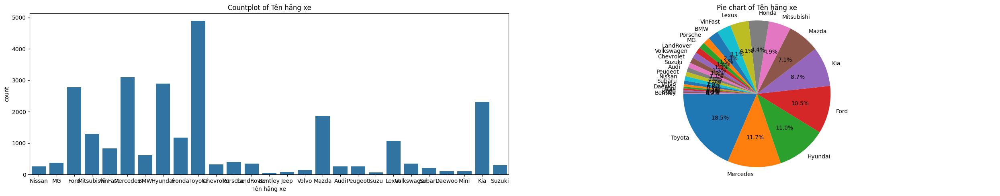

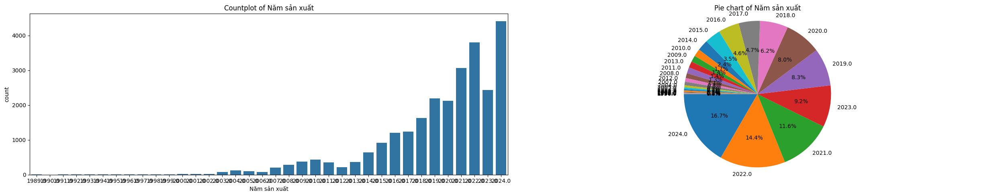

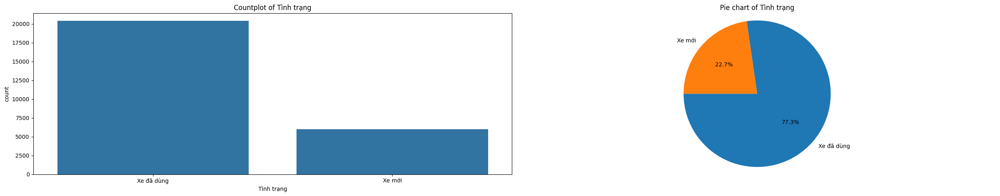

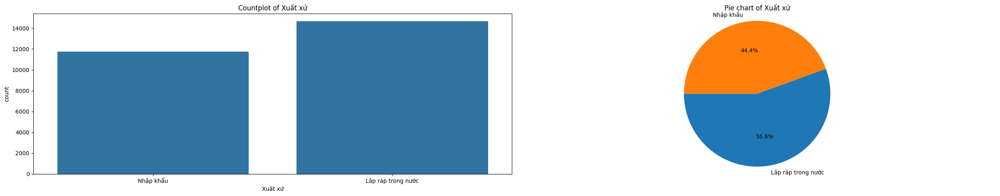

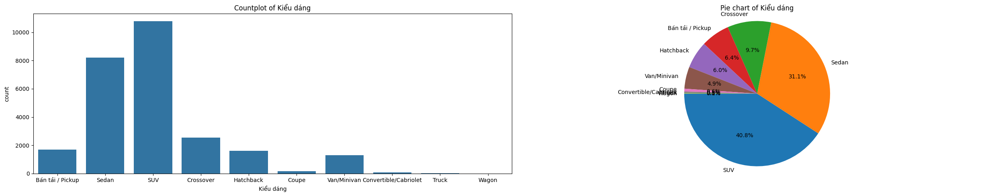

...

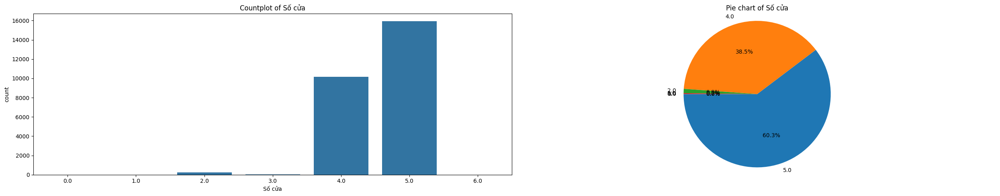

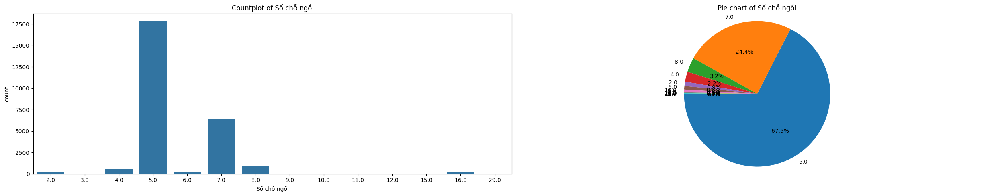

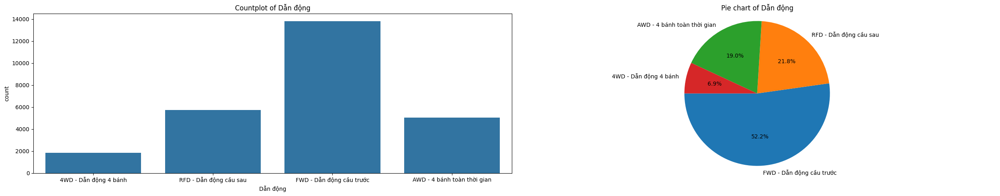

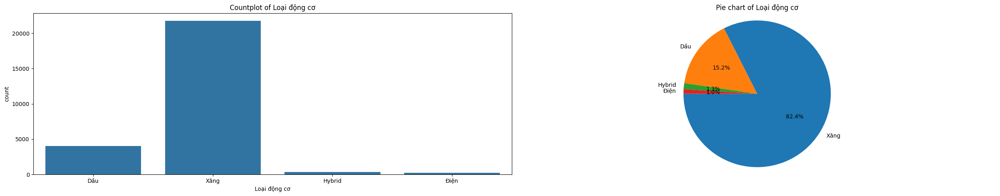

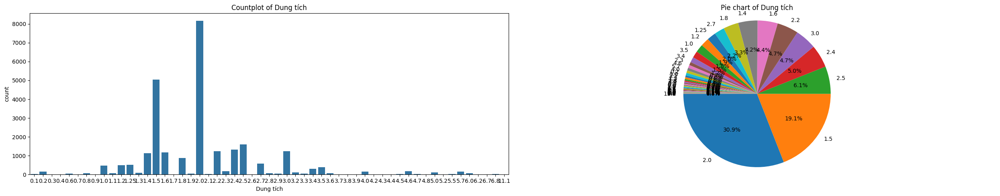

In [39]:
for column in ['Tên hãng xe', 'Năm sản xuất', 'Tình trạng', 'Xuất xứ', 'Kiểu dáng','Hộp số','Màu ngoại thất', 'Màu nội thất', 'Số cửa', 'Số chỗ ngồi', 'Dẫn động', 'Loại động cơ', 'Dung tích']:
        # Tạo figure và axes cho countplot và pie chart
        fig, axs = plt.subplots(1, 2, figsize=(25, 5))

        # Vẽ countplot
        sns.countplot(x=column, data=df, ax=axs[0])
        axs[0].set_title(f'Countplot of {column}')

        # Đếm số lượng giá trị duy nhất trong cột và vẽ pie chart
        value_counts = df[column].value_counts()
        axs[1].pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=180)
        axs[1].set_title(f'Pie chart of {column}')
        axs[1].axis('equal')  # Đảm bảo biểu đồ pie là hình tròn

        # Hiển thị biểu đồ
        plt.tight_layout()
        plt.show()

Bảng tần xuất các giá trị ở các cột còn lại

In [45]:
column = ["Tỉnh"]
element_count_df = df[column].value_counts().to_frame().reset_index()
element_count_df.columns = ['Tỉnh', 'Count']
print(f"Column '{column}':")
print(element_count_df)
print()

Column '['Tỉnh']':
          Tỉnh  Count
0       Hà Nội  15286
1       TP HCM   5638
2    Hải Phòng    570
3   Bình Dương    485
4      Đà Nẵng    305
..         ...    ...
58   Vĩnh Long      4
59    Trà Vinh      3
60    Lai Châu      3
61    Bạc Liêu      3
62    Cao Bằng      2

[63 rows x 2 columns]



## Checking distribution

#### Giá

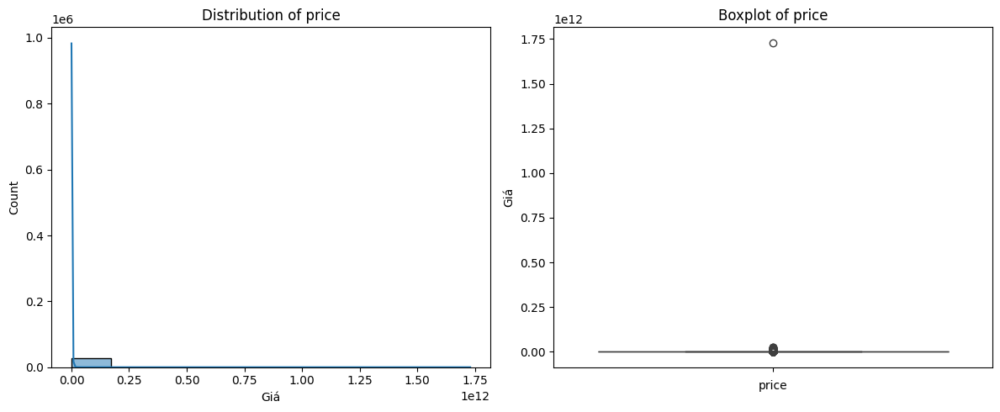

In [46]:
fig,axes=plt.subplots(1,2,figsize=(12,5))

# Distribution plot for the "Giá" column
sns.histplot(df['Giá'], kde=True, bins=10, ax=axes[0])
axes[0].set_title("Distribution of price")
axes[0].set_xlabel("Giá")
axes[0].set_ylabel("Count")

# Boxplot plot for the "Giá" column
sns.boxplot(data=df, y='Giá',ax=axes[1])
axes[1].set_title("Boxplot of price")
axes[1].set_xlabel("price")

# Adjust layout
plt.tight_layout()

# Display the subplots
plt.show()

* Phân bố giá có độ lệch dương
* Có một số ngoại lệ được quan sát thấy 

In [40]:
# Giảm độ lớn của giá
df['Giá']=np.log(df['Giá'])

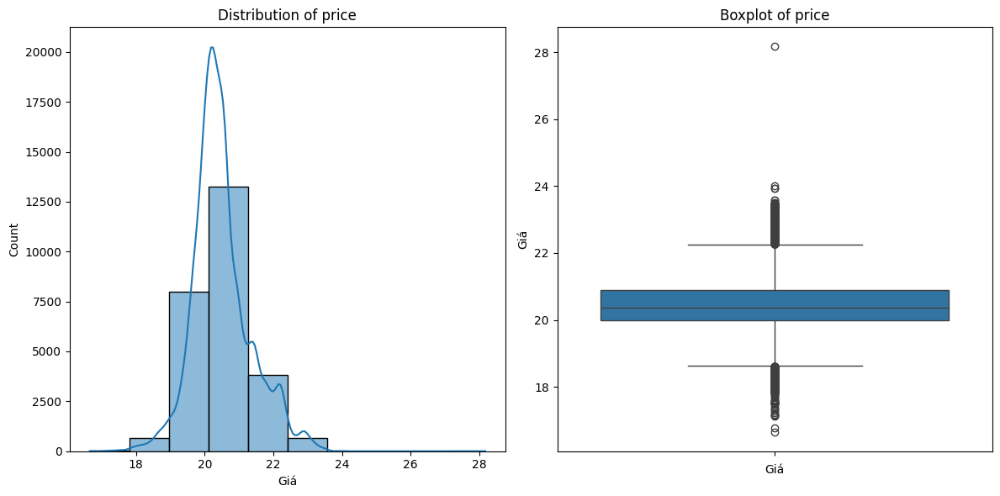

In [48]:
fig,axes=plt.subplots(1,2,figsize=(12,6))

# Distribution plot for the "Giá" column
sns.histplot(df['Giá'], kde=True, bins=10, ax=axes[0])
axes[0].set_title("Distribution of price")
axes[0].set_xlabel("Giá")
axes[0].set_ylabel("Count")

# Boxplot plot for the "price" column
sns.boxplot(data=df, y='Giá',ax=axes[1])
axes[1].set_title("Boxplot of price")
axes[1].set_xlabel("Giá")

# Adjust layout
plt.tight_layout()

# Display the subplots
plt.show()

In [49]:
# Chọn các cột có kiểu dữ liệu số
numeric_df = df.select_dtypes(include=['number'])

# Tính toán ma trận tương quan cho các cột số
numeric_df.corr().loc['Giá']

Năm sản xuất    0.468881
Giá             1.000000
Số chỗ ngồi     0.036079
Số cửa          0.115120
Số Km đã đi    -0.021388
Dung tích       0.523831
Name: Giá, dtype: float64

In [50]:
# Tương quan
numeric_df.corr()

,Năm sản xuất,Giá,Số chỗ ngồi,Số cửa,Số Km đã đi,Dung tích
Năm sản xuất,1.000000,0.468881,0.005764,0.100895,-0.020530,-0.229353
Giá,0.468881,1.000000,0.036079,0.115120,-0.021388,0.523831
Số chỗ ngồi,0.005764,0.036079,1.000000,0.323442,-0.002518,0.163051
Số cửa,0.100895,0.115120,0.323442,1.000000,0.003668,0.032697
Số Km đã đi,-0.020530,-0.021388,-0.002518,0.003668,1.000000,-0.007537
Dung tích,-0.229353,0.523831,0.163051,0.032697,-0.007537,1.000000


Biểu đồ heatmap giữa các cột số và cột giá


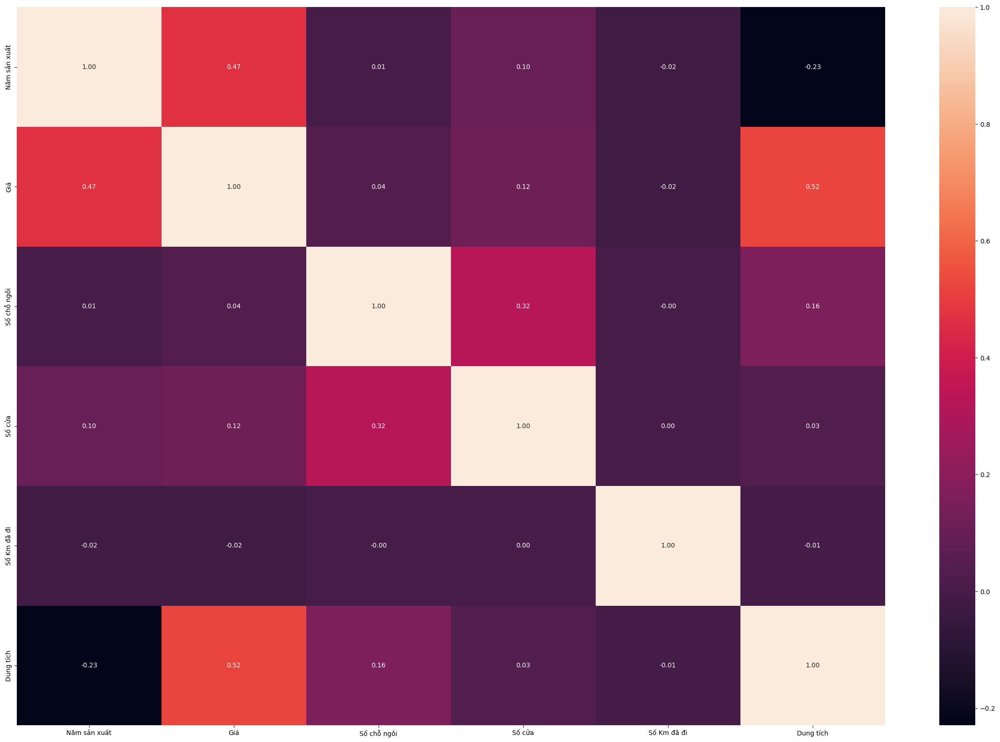

In [51]:
plt.figure(figsize=(30, 20))

# Create the heatmap of the correlation matrix
sns.heatmap(numeric_df.corr(), annot=True, fmt='.2f')

# Display the plot
plt.show()

## Phân tích uni_variate cho các cột số

### Độ lệch

In [52]:
numeric_df.skew()

Năm sản xuất     -1.633476
Giá               0.581436
Số chỗ ngồi       3.343560
Số cửa           -1.265531
Số Km đã đi     159.514705
Dung tích         2.017505
dtype: float64

* Năm sản xuất (-1.601737): Độ lệch âm mạnh, phân phối chủ yếu tập trung về phía bên trái trục x. Có thể hầu như các xe trong dữ liệu được sản xuất gần đây
* Giá (150.418760): Độ lệch dương mạnh, cho thấy phân phối chủ yếu tập trung phía bên phải trục x. Có thể hầu hết các xe có giá quá cao
* Số chỗ ngồi (6.348299): Độ lệch dương, cho thấy phân phối có đuôi dài bên phải. Có thể hầu hết các xe trong dữ liệu có số chỗ ngồi lớn
* Số cửa (-2.088292): Độ lệch âm, cho thấy phân phối chủ yếu tập trung về bên trái của trục x. Có thể hầy hết các xe có số cửa ít
* Số Km đã đi (151.900523): Độ lệch dương mạnh, cho thấy phân phối chủ yếu bên phải trục x. Có thể hầu hết các xe trong dữ liệu có số Km đã đi lớn

### Độ nhọn

In [53]:
numeric_df.kurt()

Năm sản xuất        3.518031
Giá                 1.226071
Số chỗ ngồi        26.119440
Số cửa              2.867570
Số Km đã đi     25731.460665
Dung tích           7.534972
dtype: float64

* Năm sản xuất (3.376426): Độ nhọn dương cho thấy phân phối có đỉnh cao hơn và đuôi dài hơn phân phối chuẩn. Cho thấy một số xe được sản xuất ở các năm cụ thể có tần xuất cao hơn những năm còn lại.
* Giá (23055.802151): Độ nhọn dương mạnh, phân phối có đỉnh cao hơn và đuôi dài hơn phân phối chuẩn. Cho thấy một số xe có giá trị rất cao so với phần còn lại của dữ liệu.
* Số chỗ ngồi (99.984573): Độ nhọn dương mạnh, phân phối có đỉnh cao hơn và đuôi dài hơn phân phối chuẩn. Cho thấy một số xe có số cửa rất lớn so với phần còn lại.
* Số Km đã đi (23334.466853): Độ nhọn dương mạnh, phân phối có đỉnh cao hơn và đuôi dài hơn phân phối chuẩn. Cho thấy một số xe đã đi số Km rất lớn so với phần còn lại

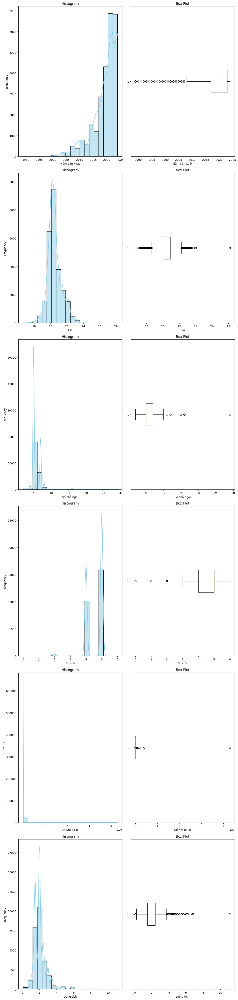

In [54]:
# Select numerical columns
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Create subplots for the histograms
fig, axes = plt.subplots(nrows=len(numeric_columns), ncols=2, figsize=(12, 50))
fig.subplots_adjust(hspace=0.5)

# Generate histograms and box plots
for i, column in enumerate(numeric_columns):
    # Histogram
    sns.histplot(data=df, x=column, bins=20, color='skyblue',kde=True, ax=axes[i,0])
    axes[i, 0].set_xlabel(column)
    axes[i, 0].set_ylabel('Frequency')
    axes[i, 0].set_title('Histogram')

    # Box plot
    axes[i, 1].boxplot(df[column], vert=False)
    axes[i, 1].set_xlabel(column)
    axes[i, 1].set_title('Box Plot')

# Show the plots
plt.tight_layout()
plt.show()

## Phân tích uni_variate cho các cột phân loại

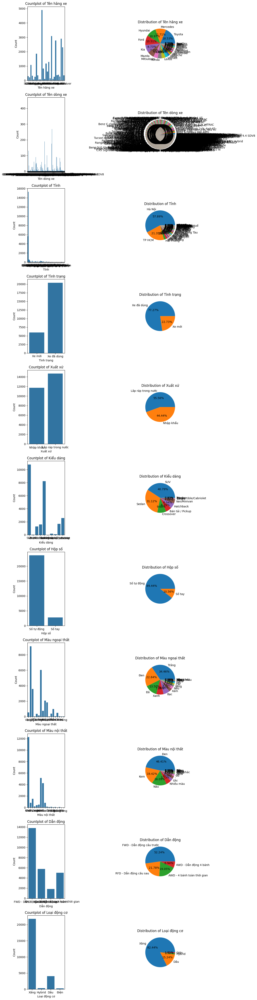

In [55]:
cat=[]
for column in df.columns:
    if df[column].dtype== object:
        cat.append(column)
# Assuming 'cat' is a list of categorical column names
fig, axes = plt.subplots(nrows=len(cat), ncols=2, figsize=(12, 50))

for i, column in enumerate(cat):
    
    # Plot the count plot (histogram) in the first column of the current row
        sns.countplot(x=column, data=df, ax=axes[i, 0])
        axes[i, 0].set_xlabel(column)
        axes[i, 0].set_ylabel('Count')
        axes[i, 0].set_title('Countplot of ' + column)

    # Plot the pie chart in the second column of the current row using Pandas plot
        df[column].value_counts().plot(kind='pie', autopct='%.2f%%', ax=axes[i, 1])
        axes[i, 1].set_title('Distribution of ' + column)
        axes[i, 1].set_ylabel('')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Display the subplots
plt.show()

### Phân tích bi-variate cho giá và cột số

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


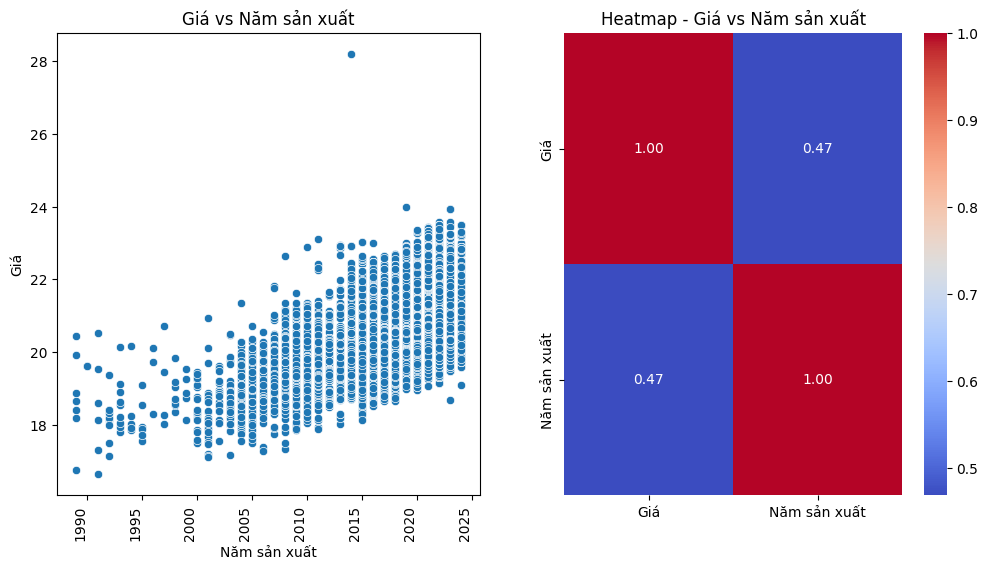

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


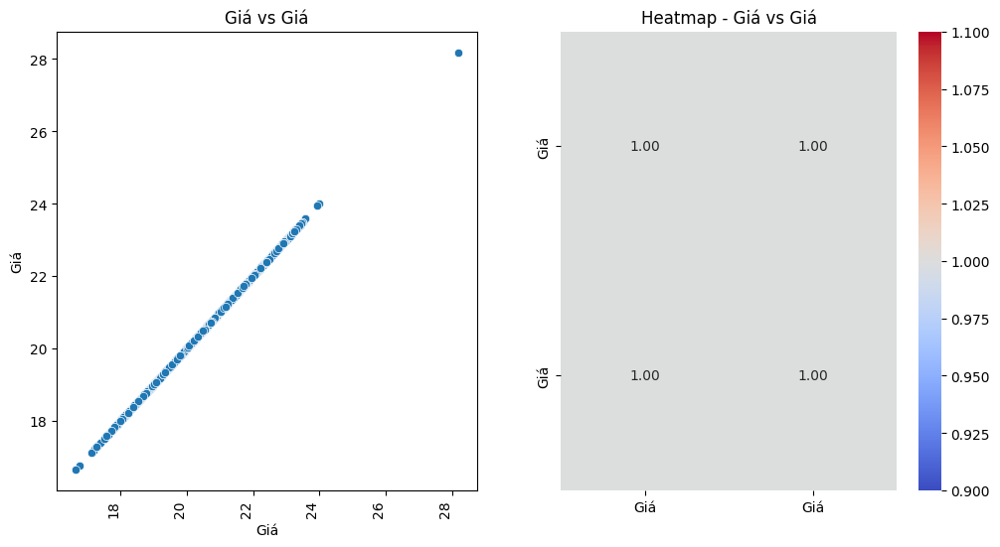

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


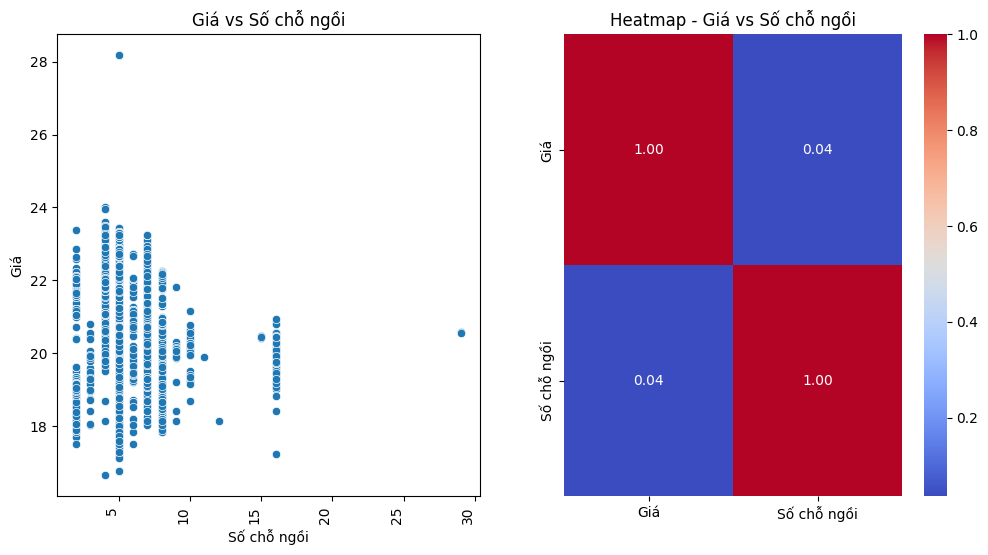

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


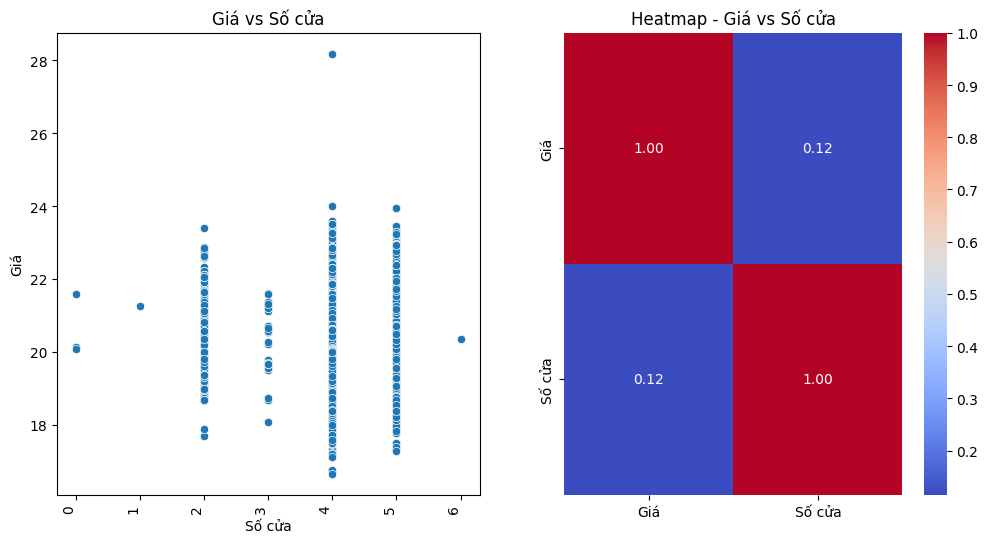

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


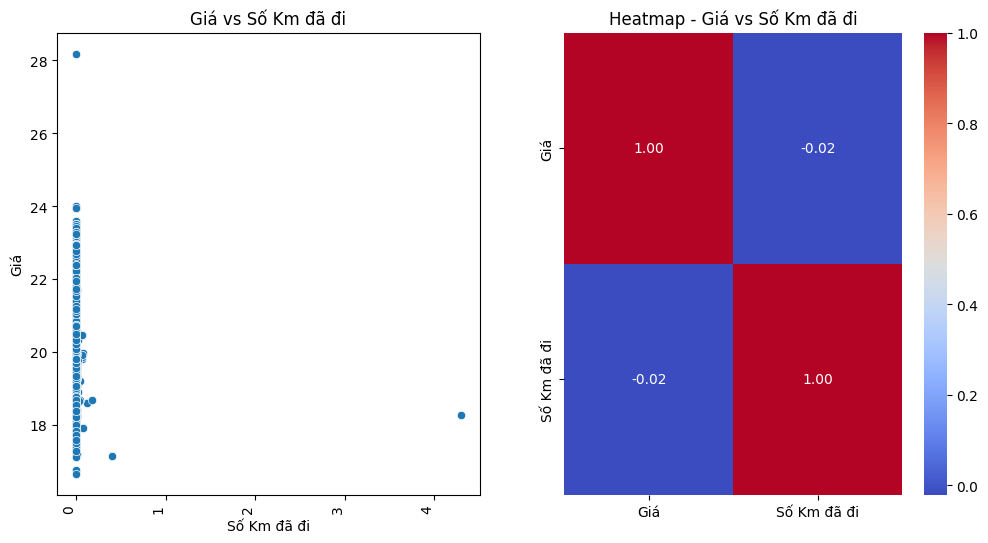

/tmp/ipykernel_34567/4025047005.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')


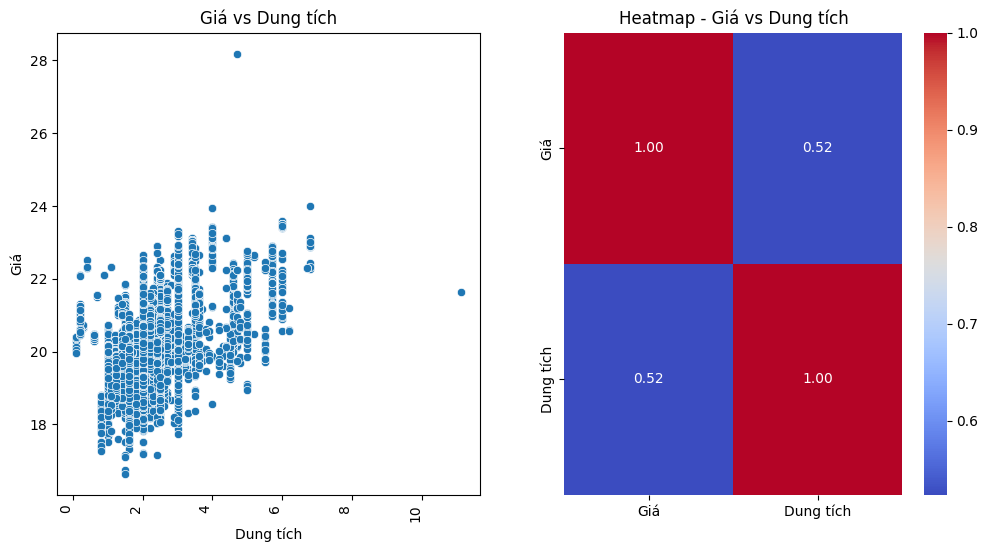

In [56]:
# Select numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns

for column in numerical_columns:
    # Create subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Scatter plot using seaborn
    sns.scatterplot(x=df[column], y=df['Giá'], ax=axes[0])
    axes[0].set_xlabel(column)
    axes[0].set_ylabel('Giá')
    axes[0].set_title('Giá vs ' + column)
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90, ha='right')

    # Heatmap using seaborn
    sns.heatmap(df[['Giá', column]].corr(), annot=True, fmt=".2f", cmap='coolwarm', ax=axes[1])

    # Set plot title
    plt.title("Heatmap - Giá vs " + column)

    # Display the plot
    plt.show()



In [59]:
# Select numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns
for column in numerical_columns:
    correlation, p_value = pearsonr(df['Giá'], df[column])
    print("Correlation with 'Giá' for column '{}' : {:.4f}".format(column, correlation))
    print("p-value for column '{}' : {:.4f}".format(column, p_value))
    print("------------------------------------------------------")

Correlation with 'Giá' for column 'Năm sản xuất' : 0.4689
p-value for column 'Năm sản xuất' : 0.0000
------------------------------------------------------
Correlation with 'Giá' for column 'Giá' : 1.0000
p-value for column 'Giá' : 0.0000
------------------------------------------------------
Correlation with 'Giá' for column 'Số chỗ ngồi' : 0.0361
p-value for column 'Số chỗ ngồi' : 0.0000
------------------------------------------------------
Correlation with 'Giá' for column 'Số cửa' : 0.1151
p-value for column 'Số cửa' : 0.0000
------------------------------------------------------
Correlation with 'Giá' for column 'Số Km đã đi' : -0.0214
p-value for column 'Số Km đã đi' : 0.0005
------------------------------------------------------
Correlation with 'Giá' for column 'Dung tích' : 0.5238
p-value for column 'Dung tích' : 0.0000
------------------------------------------------------


### Phân tích bi_variate cho cột giá và các cột phân loại

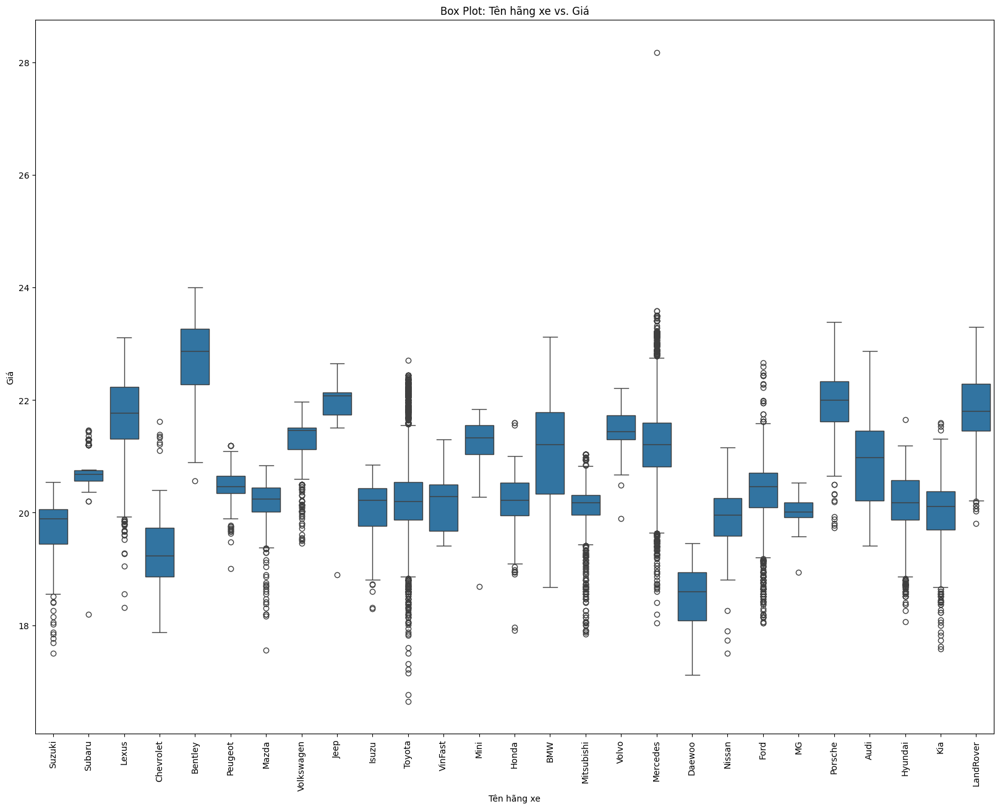

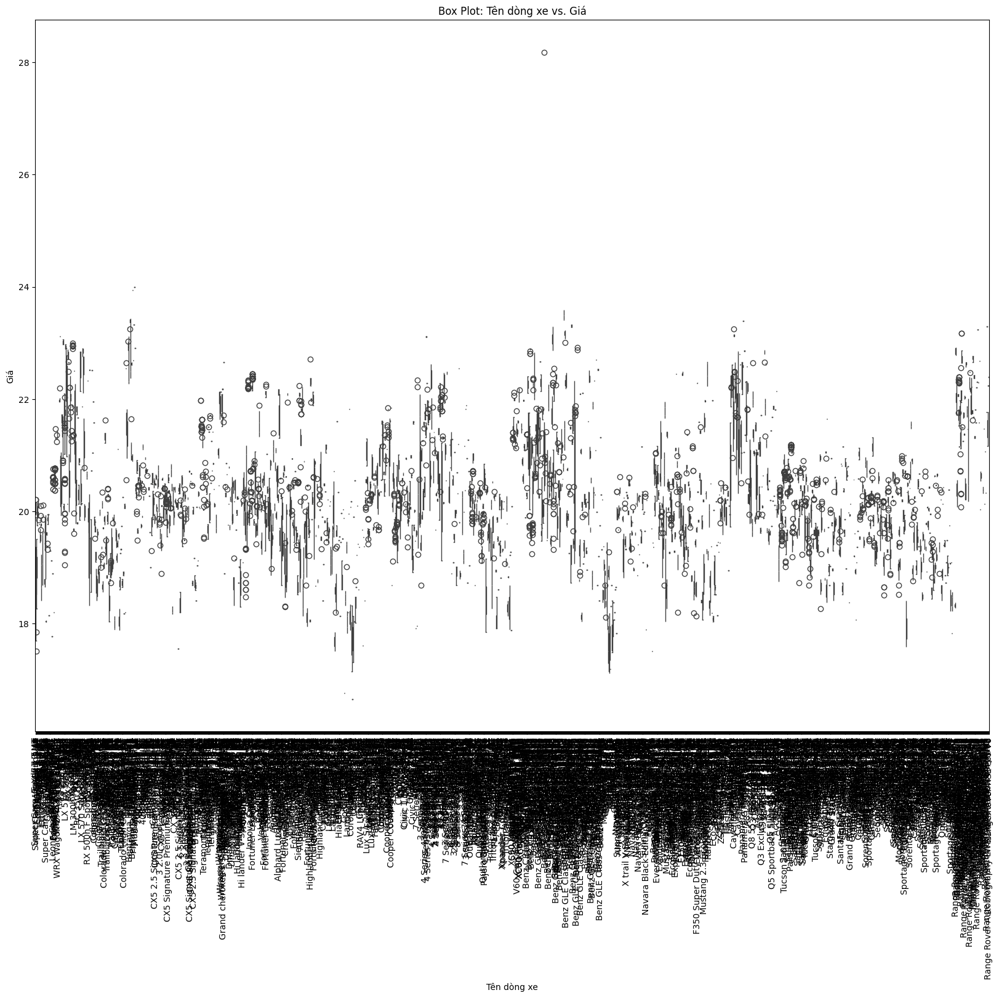

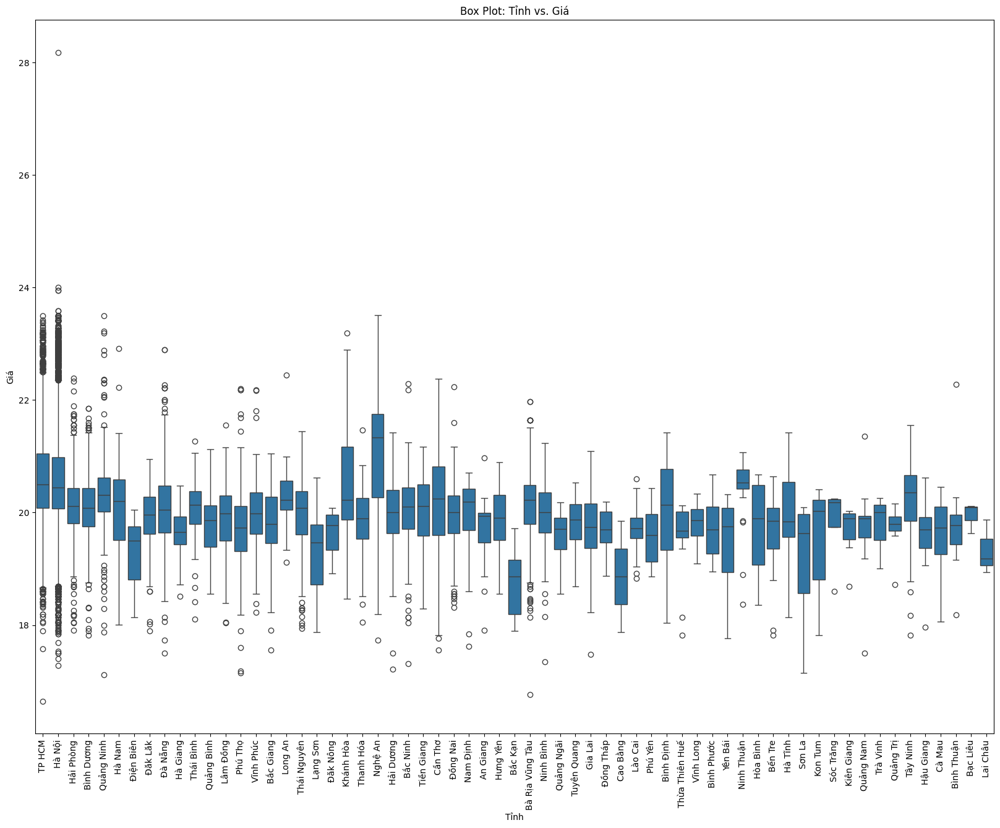

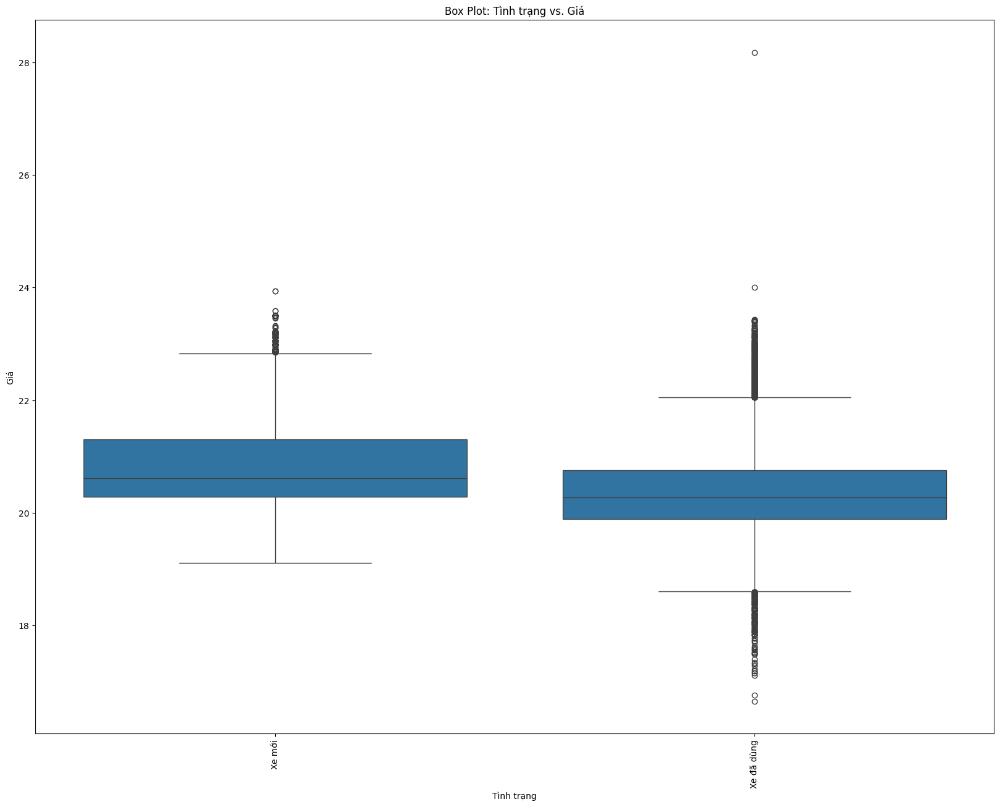

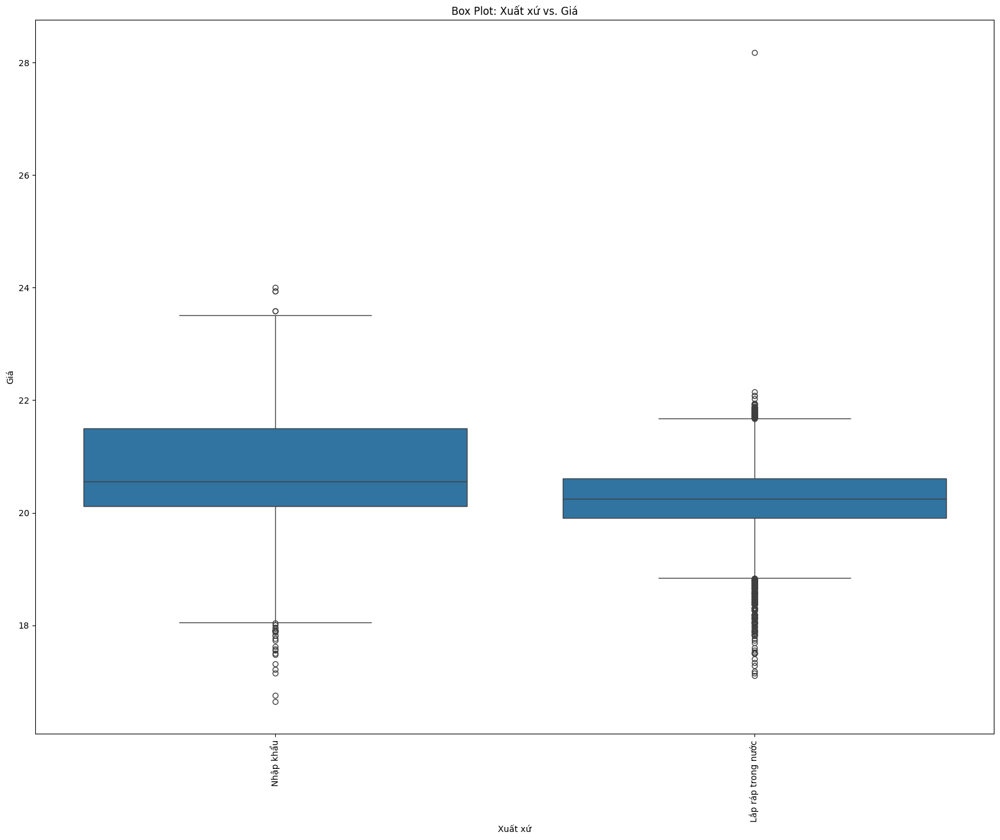

...

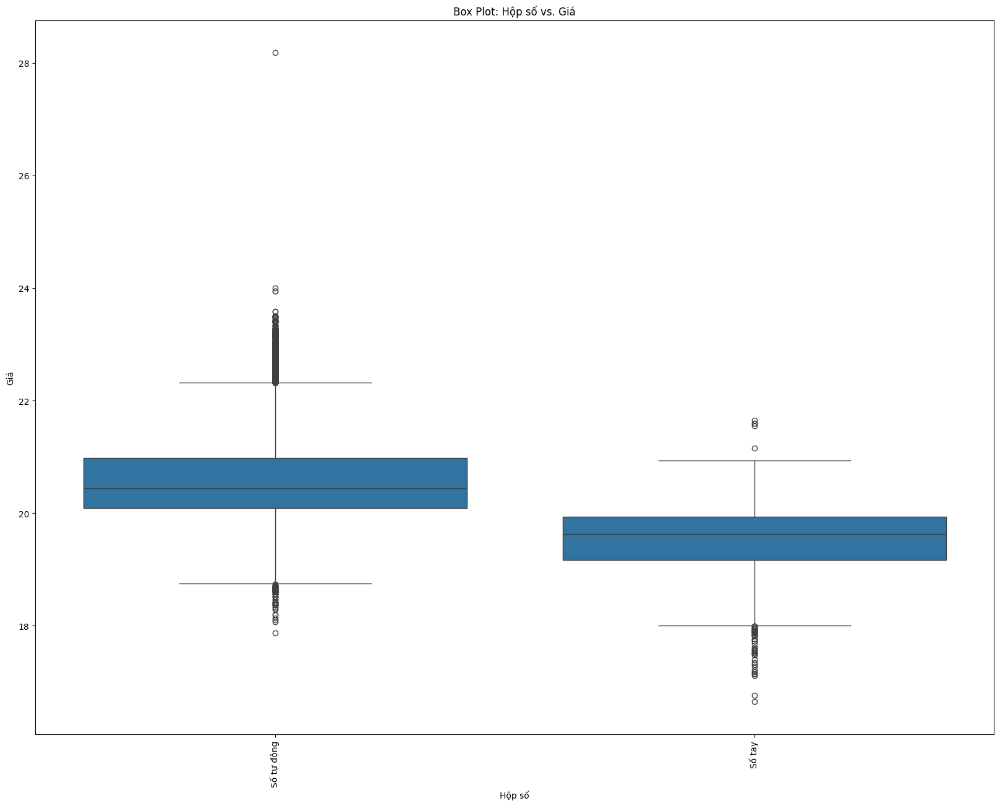

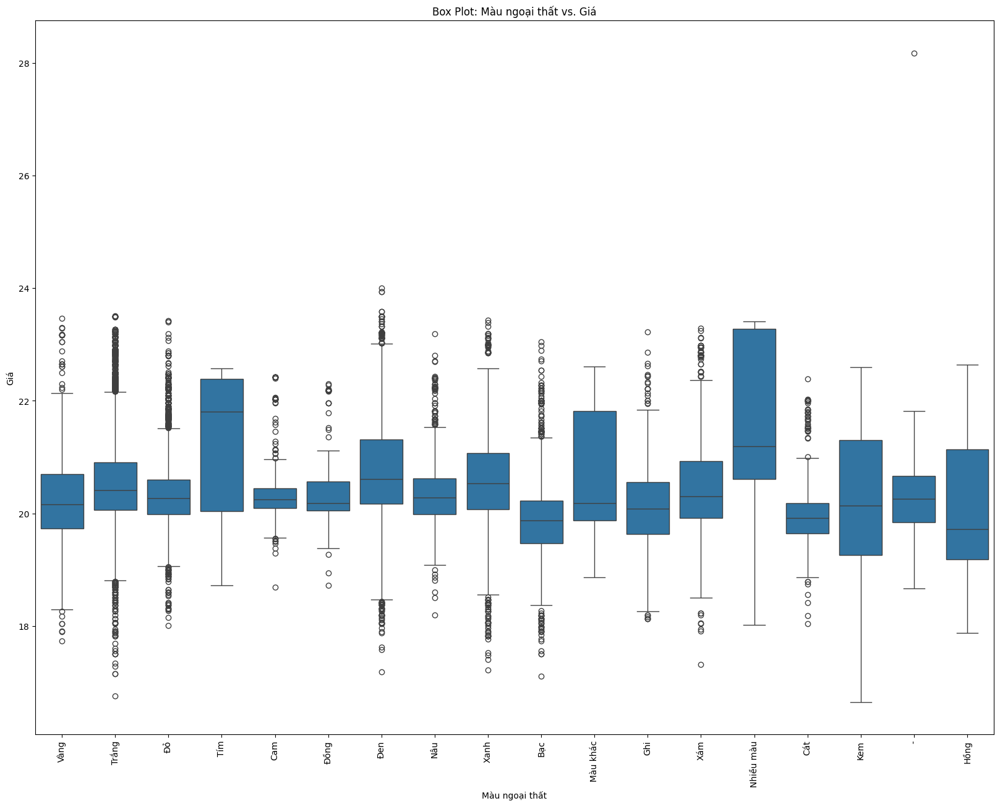

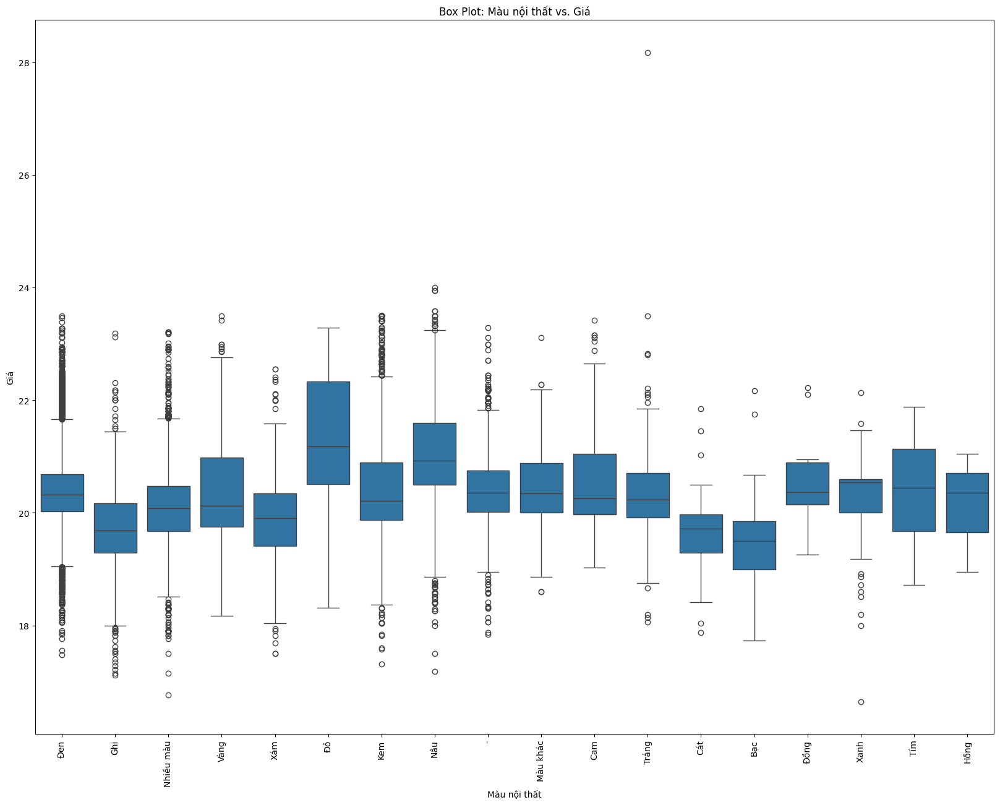

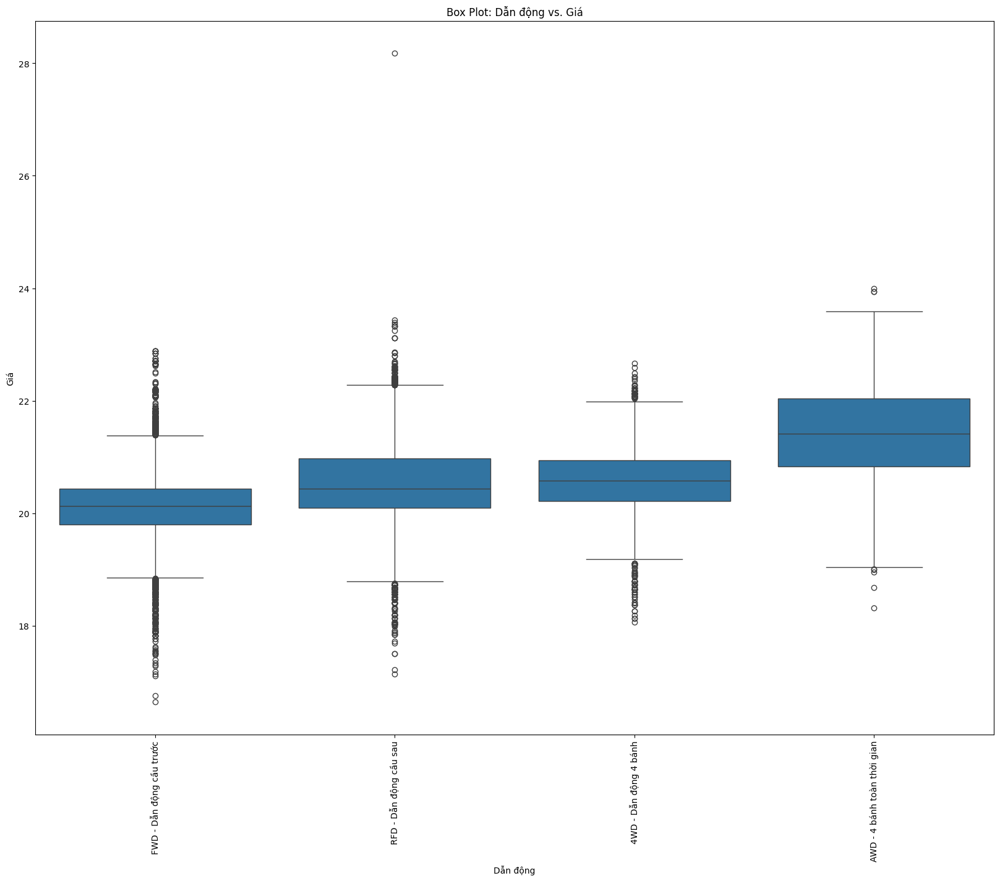

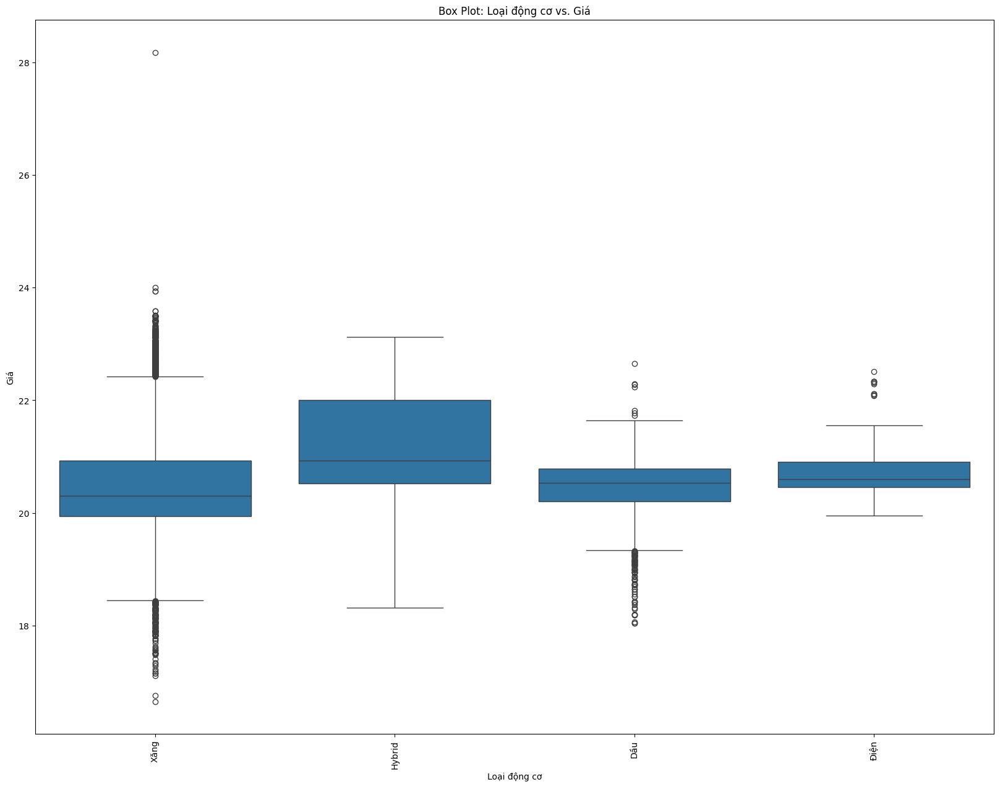

In [60]:
categorical_column=[]
for column in df.columns:
    if df[column].dtype== object:
        categorical_column.append(column)
        
# Loop through each categorical column
for column in categorical_column:
    plt.figure(figsize=(20, 15))
    
    # Create a box plot
    sns.boxplot(data=df, x=column, y='Giá')
    
    # Set labels and title
    plt.xlabel(column)
    plt.ylabel('Giá')
    plt.title(f'Box Plot: {column} vs. Giá')
    
    # Rotate x-axis labels for better visibility
    plt.xticks(rotation=90)
    
    # Display the plot
    plt.show()

In [41]:
from scipy.stats import f_oneway
import pandas as pd

# Assuming you have a DataFrame named 'df' containing the data
# and 'categorical_column' is a list of categorical columns
categorical_column=[]
for column in df.columns:
    if df[column].dtype== object:
        categorical_column.append(column)

for column in categorical_column:
    # Drop any rows with missing values
    data = df[['Giá', column]].copy()
    data.dropna(inplace=True)

    # Perform ANOVA
    groups = [data[data[column] == value]['Giá'] for value in data[column].unique()]
    f_statistic, p_value = f_oneway(*groups)

    # Create DataFrame to display results
    results = pd.DataFrame({'Group': data[column].unique(), 'F-Statistic': f_statistic, 'p-value': p_value})
    
    # Print the ANOVA table
    print(f"ANOVA Test for {column}")
    print(results.head())
    print("---------------------------")


ANOVA Test for Tên hãng xe
        Group  F-Statistic  p-value
0      Nissan   850.177006      0.0
1          MG   850.177006      0.0
2        Ford   850.177006      0.0
3  Mitsubishi   850.177006      0.0
4     VinFast   850.177006      0.0
---------------------------
ANOVA Test for Tên dòng xe
                       Group  F-Statistic  p-value
0       Navara VL 2.5 AT 4WD   343.738002      0.0
1        Navara EL Premium R   343.738002      0.0
2  Sunny Q Series XT Premium   343.738002      0.0
3  Almera VL 1.0 CVT Cao cấp   343.738002      0.0
4         Terra E 2.5 AT 2WD   343.738002      0.0
---------------------------
ANOVA Test for Tỉnh
       Group  F-Statistic  p-value
0     Hà Nội    44.700071      0.0
1     TP HCM    44.700071      0.0
2    Nghệ An    44.700071      0.0
3   Đồng Nai    44.700071      0.0
4  Thái Bình    44.700071      0.0
---------------------------
ANOVA Test for Tình trạng
        Group  F-Statistic  p-value
0  Xe đã dùng  1544.044664      0.0
1      Xe mớ

/tmp/ipykernel_11966/3188225898.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


/tmp/ipykernel_11966/3188225898.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


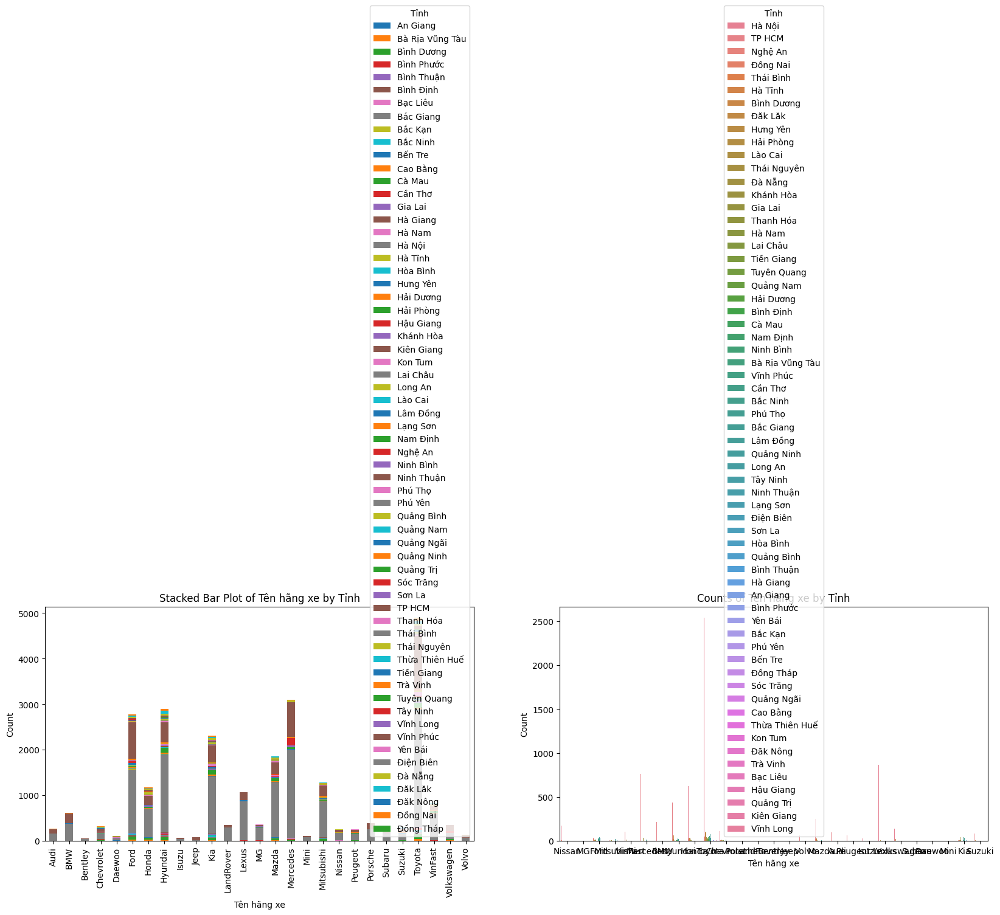

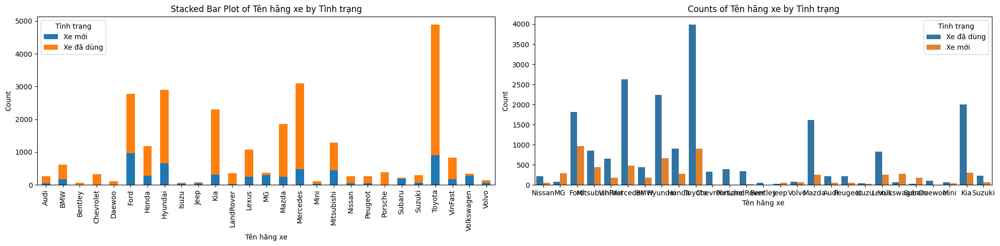

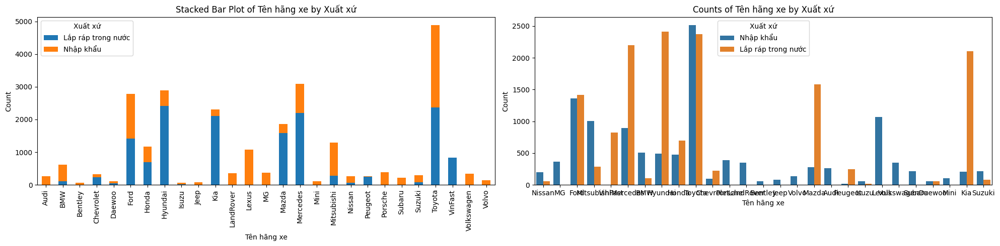

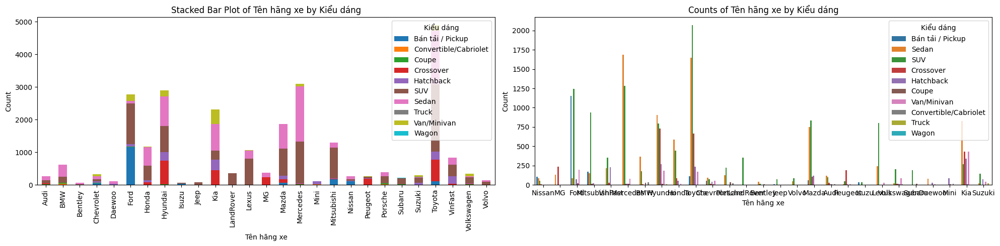

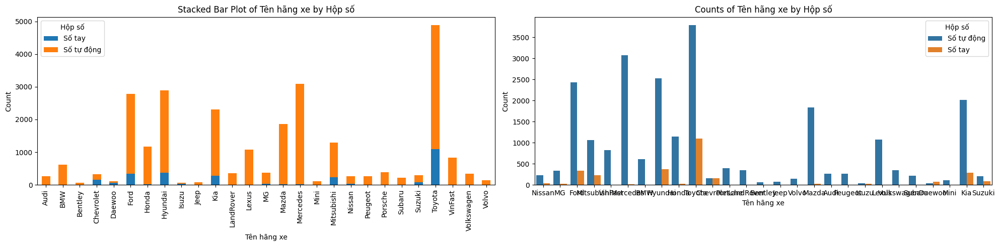

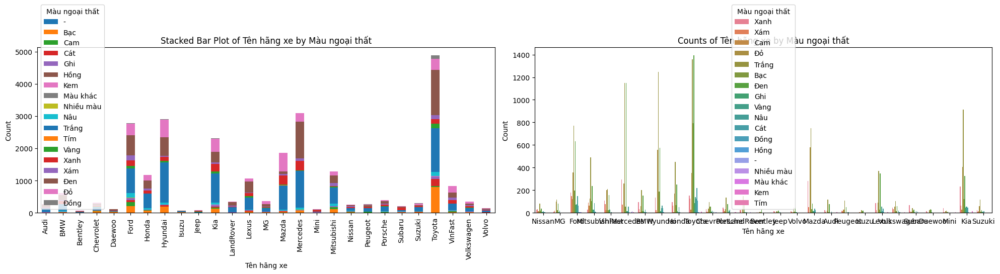

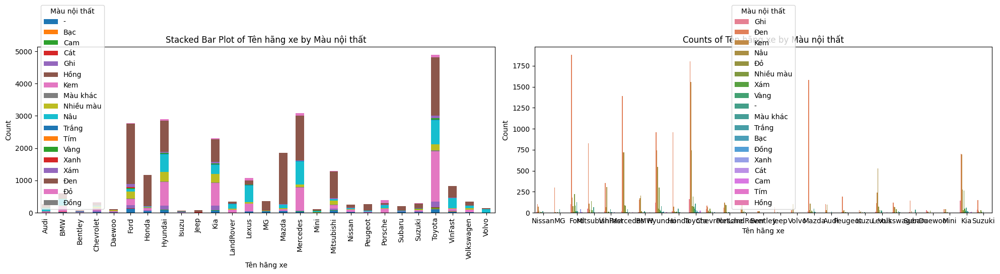

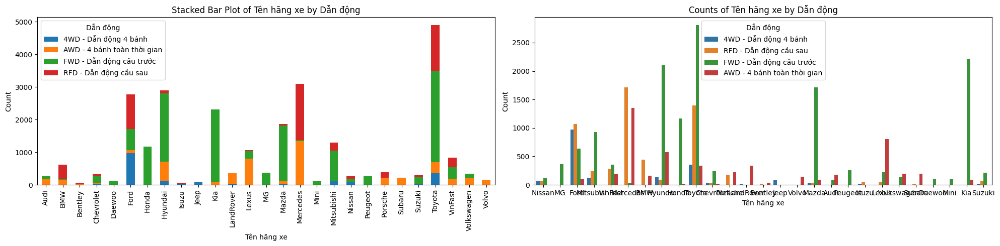

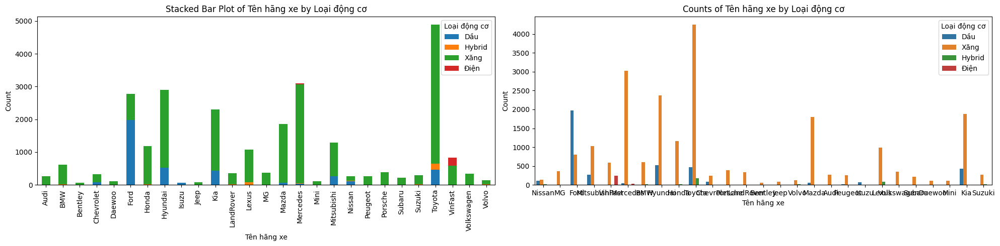

/tmp/ipykernel_11966/3188225898.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


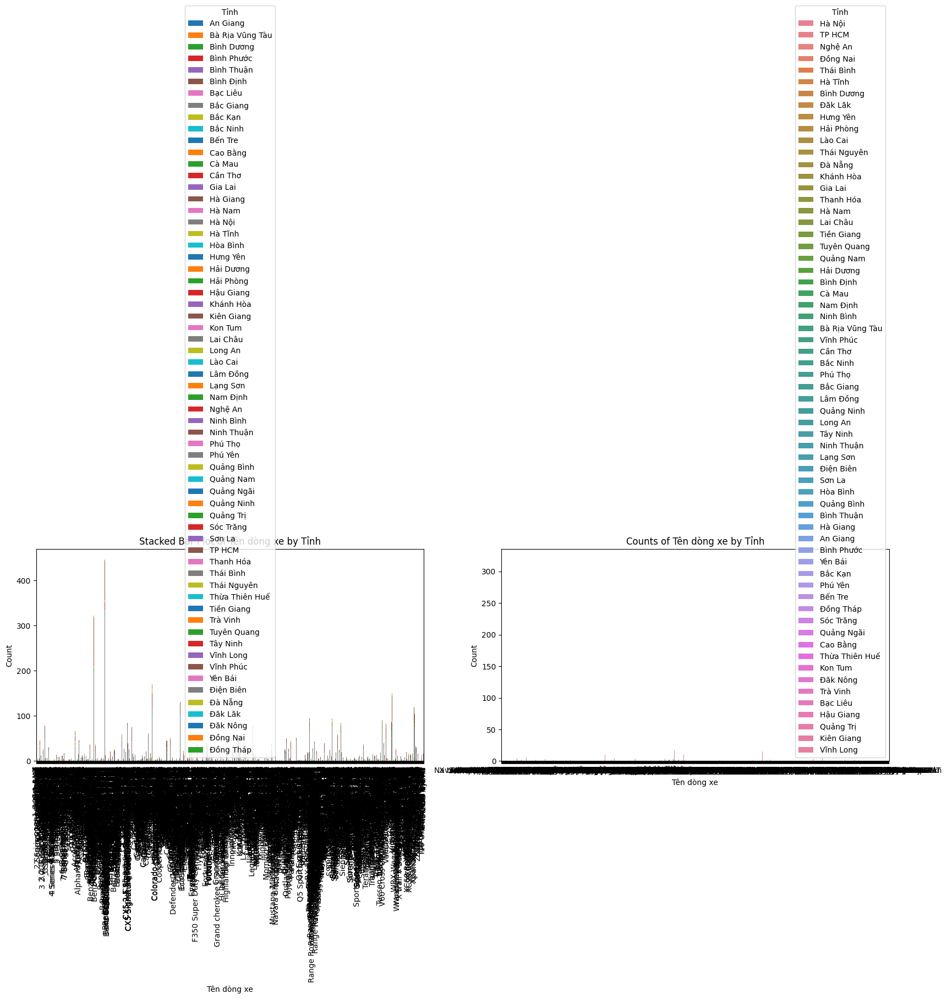

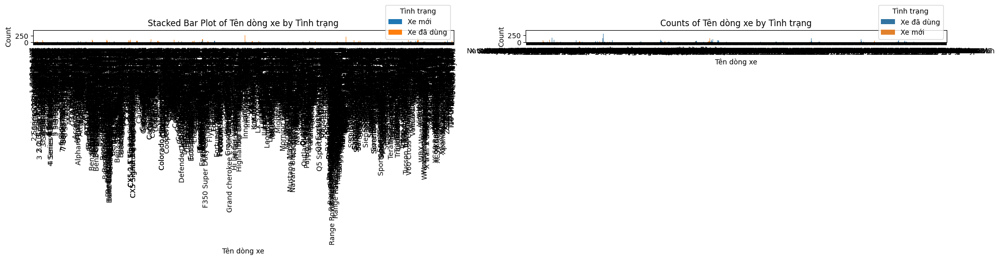

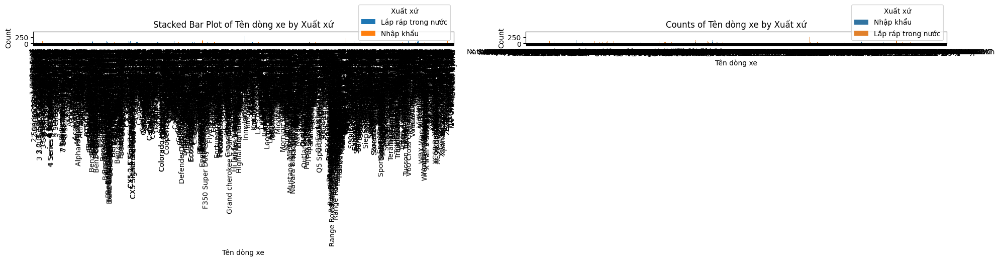

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7ee300fa51b0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [42]:
for i in range(len(categorical_column)):
    for j in range(i + 1, len(categorical_column)):
        # Tabulation
        tab = pd.crosstab(df[categorical_column[i]], df[categorical_column[j]])

        # Create subplots
        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 5))

        # Stacked Bar Plot
        tab.plot(kind='bar', stacked=True, ax=axes[0])
        axes[0].set_xlabel(categorical_column[i])
        axes[0].set_ylabel('Count')
        axes[0].set_title(f'Stacked Bar Plot of {categorical_column[i]} by {categorical_column[j]}')

        # Grouped Bar Plot
        sns.countplot(data=df, x=categorical_column[i], hue=categorical_column[j], ax=axes[1])
        axes[1].set_xlabel(categorical_column[i])
        axes[1].set_ylabel('Count')
        axes[1].set_title(f'Counts of {categorical_column[i]} by {categorical_column[j]}')

        plt.tight_layout()
        plt.show()

#### Kiểm tra thống kê

In [ ]:
cat_columns=[]
for column in df.columns:
    if df[column].dtype== object:
        cat_columns.append(column)
        
# Create an empty dictionary to store chi-square test results
chi_square_results = {}

# Tabulation and Chi-Square Test
for i in range(len(cat_columns)):
    for j in range(i + 1, len(cat_columns)):
        # Tabulation
        tab = pd.crosstab(df[cat_columns[i]], df[cat_columns[j]])
        
        # Perform chi-square test of independence
        chi2, p_value, dof, expected = stats.chi2_contingency(tab)
        
        # Store the results in the dictionary
        chi_square_results[(cat_columns[i], cat_columns[j])] = {'Chi-Square': chi2, 'P-Value': p_value}

# Print Chi-Square Test results
for pair, result in chi_square_results.items():
    print(f"Chi-Square Test of Independence for {pair}:")
    print(f"Chi-Square Statistic: {result['Chi-Square']}")
    print(f"P-Value: {result['P-Value']}")
    print("--------------------------------------------------")

Chi-Square Test of Independence for ('Tên hãng xe', 'Tên dòng xe'):
Chi-Square Statistic: 686556.0
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Tỉnh'):
Chi-Square Statistic: 7614.181185011548
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Tình trạng'):
Chi-Square Statistic: 2933.633465413212
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Xuất xứ'):
Chi-Square Statistic: 9424.817325459673
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Kiểu dáng'):
Chi-Square Statistic: 24264.315789275242
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Hộp số'):
Chi-Square Statistic: 3001.2096590114775
P-Value: 0.0
---------------------------------------------

Chi-Square Test of Independence for ('Tên hãng xe', 'Tên dòng xe'):
Chi-Square Statistic: 686530.0
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Tỉnh'):
Chi-Square Statistic: 7613.921651342159
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Tình trạng'):
Chi-Square Statistic: 2933.5353394209783
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Xuất xứ'):
Chi-Square Statistic: 9423.953746892303
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Kiểu dáng'):
Chi-Square Statistic: 24268.629523272743
P-Value: 0.0
--------------------------------------------------
Chi-Square Test of Independence for ('Tên hãng xe', 'Hộp số'):
Chi-Square Statistic: 3001.8498631575385
P-Value: 0.0
--------------------------------------------

 Chia tập dữ liệu huấn luyện và kiểm thử

In [2]:
df = pd.read_pickle("data/clean/data.pkl")

In [8]:
# Chia DataFrame thành tập dữ liệu huấn luyện và tập dữ liệu kiểm tra
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Lưu DataFrame huấn luyện vào tệp 
train_df.to_csv("data/train/data_train.csv")

# Lưu DataFrame kiểm tra vào tệp 
test_df.to_csv("data/train/data_test.csv")


In [9]:
from scipy import stats

def handle_outliers(df, column):
    # Sử dụng Z-score để xác định outliers
    z_scores = stats.zscore(df[column])
    abs_z_scores = np.abs(z_scores)
    threshold = 3
    
    # Lọc ra các mẫu không phải là outliers
    df = df[(abs_z_scores < threshold)]
    
    return df

# Danh sách các cột cần xử lý outliers
columns_to_handle = ["Năm sản xuất", "Số Km đã đi", "Giá"]

# Áp dụng hàm xử lý outliers cho từng cột trên DataFrame gốc
for column in columns_to_handle:
    df = handle_outliers(df, column)


In [10]:
# Chia DataFrame thành tập dữ liệu huấn luyện và tập dữ liệu kiểm tra
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Lưu DataFrame huấn luyện vào tệp 
train_df.to_csv("data/train/data_train1.csv")

# Lưu DataFrame kiểm tra vào tệp 
test_df.to_csv("data/train/data_test1.csv")
